# Model Evaluation on Test Set
## Emotion Detection YOLO Model

This notebook evaluates the trained YOLO emotion detection model on the test dataset.

**Model Details:**
- Base Model: YOLO26n
- Classes: angry, happy, relax, rock, romantic, sad, surprise (7 classes)
- Trained for 100 epochs with early stopping (patience=10)
- Image size: 640x640

**Evaluation Metrics:**
- Precision, Recall, mAP50, mAP50-95
- Confusion Matrix
- Per-class performance
- Visual predictions on test images

In [6]:
# Import libraries
from ultralytics import YOLO
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
import yaml
from PIL import Image
import seaborn as sns

%matplotlib inline

In [7]:
# Set paths
MODEL_PATH = "runs-2\\content\\runs\detect\\train\weights\\best.pt"
DATA_YAML = "emotion-8\data.yaml"
TEST_IMAGES_DIR = "emotion-8\\test\images"
TEST_LABELS_DIR = "emotion-8\\test\labels"
OUTPUT_DIR = "model_eval_files"

# Load class names from data.yaml
with open(DATA_YAML, 'r') as f:
    data_config = yaml.safe_load(f)
    class_names = data_config['names']
    
print(f"Classes: {class_names}")
print(f"Number of classes: {len(class_names)}")

Classes: ['angry', 'happy', 'relax', 'rock', 'romantic', 'sad', 'surprise']
Number of classes: 7


In [8]:
# Load the trained model
model = YOLO(MODEL_PATH)

## 1. Overall Model Performance on Test Set

In [9]:
# Run validation on test set
metrics = model.val(data=DATA_YAML, 
                    split='test', 
                    imgsz=640, 
                    batch=16, 
                    device='cpu',
                    project = 'test')

print("\n=== Overall Test Set Performance ===")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}")
print(f"mAP50: {metrics.box.map50:.4f}")
print(f"mAP50-95: {metrics.box.map:.4f}")

Ultralytics 8.4.9  Python-3.9.25 torch-2.8.0+cpu CPU (Intel Core i5-14450HX)
YOLO26n summary (fused): 122 layers, 2,376,201 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 744.7173.5 MB/s, size: 36.6 KB)
val: Scanning D:\FIle Aku\emotion-8\test\labels.cache... 183 images, 14 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 183/183  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 1.8it/s 6.8s0.6s
                   all        183        187      0.899      0.872      0.941      0.698
                 angry         14         14      0.875      0.999      0.947      0.769
                 happy         26         27      0.866      0.889      0.958      0.779
                 relax         30         47      0.833      0.638      0.839      0.395
                  rock         27         27          1      0.948      0.995      0.662
              romantic         25         25      0.885 

## 2. Per-Class Performance Analysis

In [10]:
# Extract per-class metrics
per_class_metrics = pd.DataFrame({
    'Class': class_names,
    'Precision': metrics.box.p,
    'Recall': metrics.box.r,
    'mAP50': metrics.box.ap50,
    'mAP50-95': metrics.box.ap
})

print("\n=== Per-Class Performance ===")
print(per_class_metrics.to_string(index=False))

# Save to CSV
per_class_metrics.to_csv(os.path.join(OUTPUT_DIR, 'test_set_per_class_metrics.csv'), index=False)


=== Per-Class Performance ===
   Class  Precision   Recall    mAP50  mAP50-95
   angry   0.874937 0.999461 0.947273  0.769485
   happy   0.865561 0.888889 0.957995  0.778873
   relax   0.833318 0.638228 0.839188  0.395380
    rock   1.000000 0.948173 0.995000  0.661757
romantic   0.884551 0.919439 0.965966  0.774477
     sad   0.879343 0.730769 0.888288  0.570914
surprise   0.953738 0.982232 0.993182  0.932568


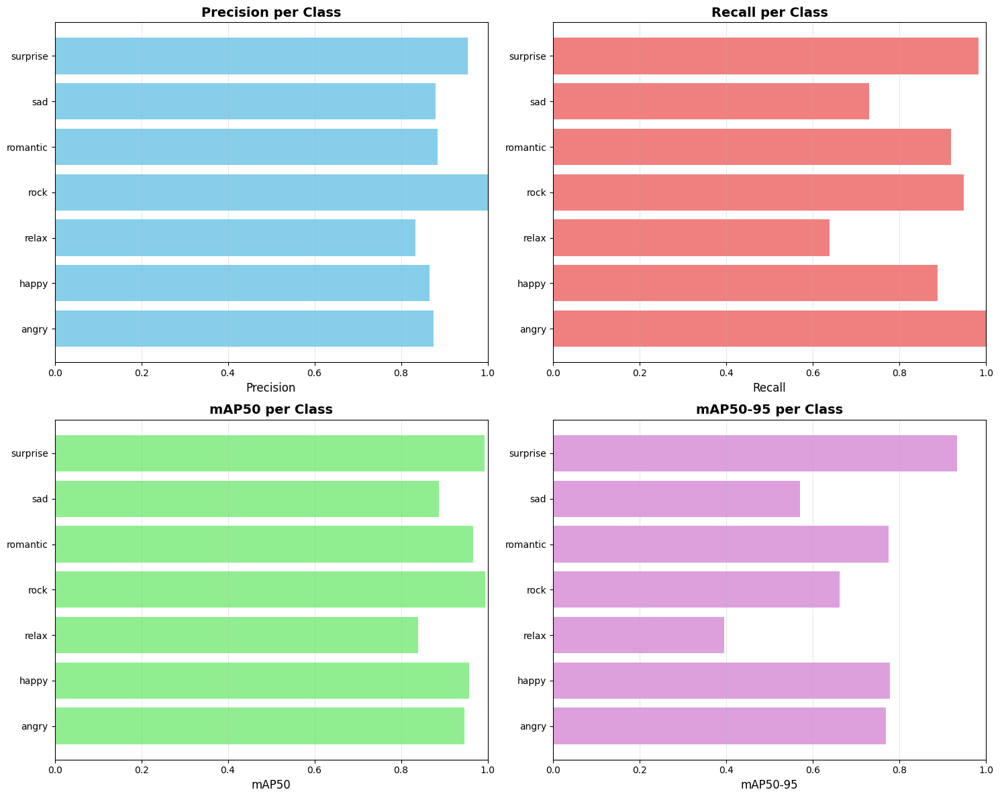

In [11]:
# Visualize per-class performance
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Precision
axes[0, 0].barh(class_names, per_class_metrics['Precision'], color='skyblue')
axes[0, 0].set_xlabel('Precision', fontsize=12)
axes[0, 0].set_title('Precision per Class', fontsize=14, fontweight='bold')
axes[0, 0].set_xlim([0, 1])
axes[0, 0].grid(axis='x', alpha=0.3)

# Recall
axes[0, 1].barh(class_names, per_class_metrics['Recall'], color='lightcoral')
axes[0, 1].set_xlabel('Recall', fontsize=12)
axes[0, 1].set_title('Recall per Class', fontsize=14, fontweight='bold')
axes[0, 1].set_xlim([0, 1])
axes[0, 1].grid(axis='x', alpha=0.3)

# mAP50
axes[1, 0].barh(class_names, per_class_metrics['mAP50'], color='lightgreen')
axes[1, 0].set_xlabel('mAP50', fontsize=12)
axes[1, 0].set_title('mAP50 per Class', fontsize=14, fontweight='bold')
axes[1, 0].set_xlim([0, 1])
axes[1, 0].grid(axis='x', alpha=0.3)

# mAP50-95
axes[1, 1].barh(class_names, per_class_metrics['mAP50-95'], color='plum')
axes[1, 1].set_xlabel('mAP50-95', fontsize=12)
axes[1, 1].set_title('mAP50-95 per Class', fontsize=14, fontweight='bold')
axes[1, 1].set_xlim([0, 1])
axes[1, 1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'test_set_per_class_performance.png'), dpi=300, bbox_inches='tight')
plt.show()

## 3. Confusion Matrix Analysis

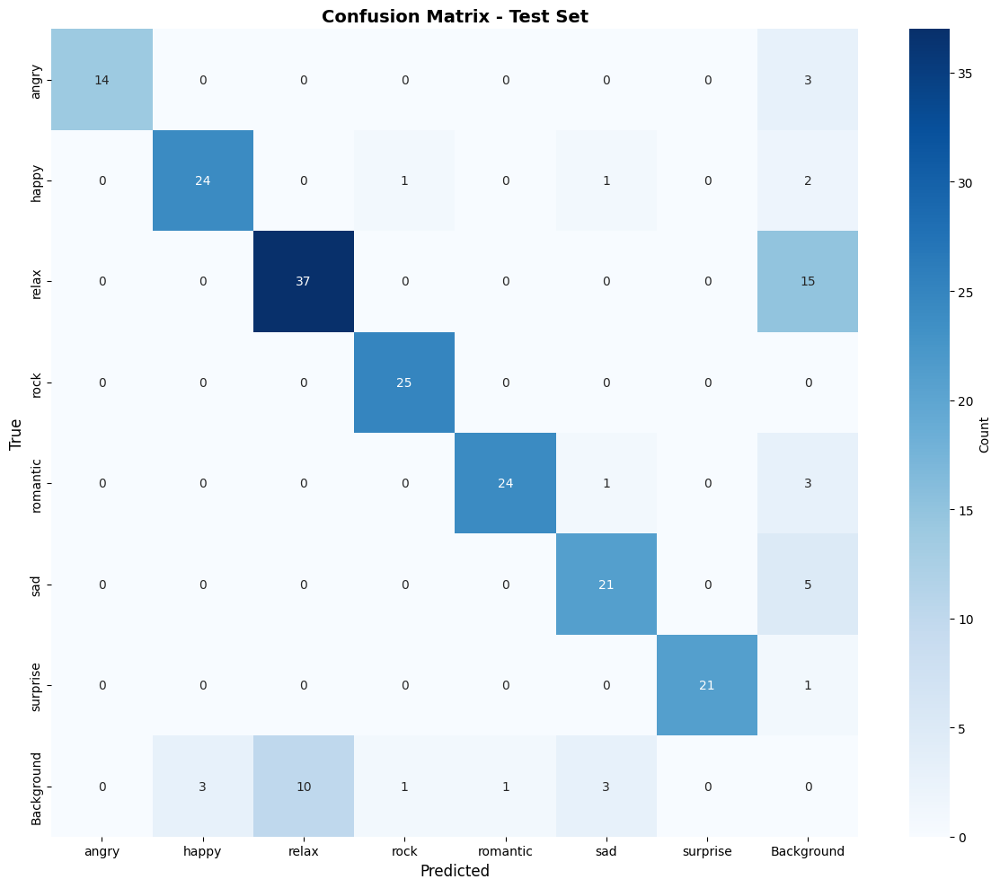

In [12]:
# Plot confusion matrix
if hasattr(metrics, 'confusion_matrix') and metrics.confusion_matrix is not None:
    cm = metrics.confusion_matrix.matrix
    
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='.0f', cmap='Blues', 
                xticklabels=class_names + ['Background'],
                yticklabels=class_names + ['Background'],
                cbar_kws={'label': 'Count'})
    plt.xlabel('Predicted', fontsize=12)
    plt.ylabel('True', fontsize=12)
    plt.title('Confusion Matrix - Test Set', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, 'test_set_confusion_matrix.png'), dpi=300, bbox_inches='tight')
    plt.show()

## 4. Sample Predictions on Test Images

In [13]:
# Get list of test images
test_images = sorted([f for f in os.listdir(TEST_IMAGES_DIR) if f.endswith(('.jpg', '.jpeg', '.png'))])
print(f"Total test images: {len(test_images)}")

# Sample random images for visualization
np.random.seed(42)
sample_images = np.random.choice(test_images, min(12, len(test_images)), replace=False)

Total test images: 183


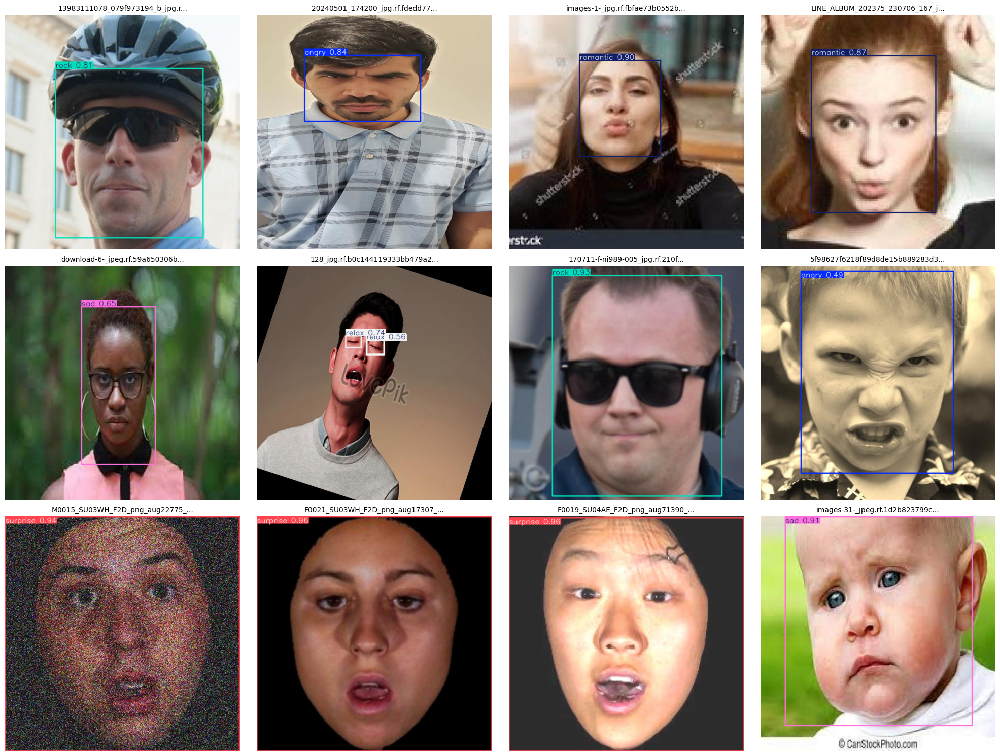

In [14]:
# Run predictions on sample images
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.ravel()

for idx, img_name in enumerate(sample_images):
    img_path = os.path.join(TEST_IMAGES_DIR, img_name)
    
    # Run prediction
    results = model.predict(img_path, conf=0.25, iou=0.45, verbose=False)
    
    # Get the plotted image with bounding boxes
    annotated_img = results[0].plot()
    
    # Convert BGR to RGB for matplotlib
    annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
    
    # Display
    axes[idx].imshow(annotated_img)
    axes[idx].axis('off')
    axes[idx].set_title(f"{img_name[:30]}...", fontsize=10)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'test_set_sample_predictions.png'), dpi=200, bbox_inches='tight')
plt.show()

## 5. Detailed Predictions for All Test Images

In [15]:
# Run predictions on all test images and collect statistics
prediction_results = []

for img_name in test_images:
    img_path = os.path.join(TEST_IMAGES_DIR, img_name)
    
    # Run prediction
    results = model.predict(img_path, conf=0.25, iou=0.45, verbose=False)
    
    # Extract detection info
    boxes = results[0].boxes
    num_detections = len(boxes)
    
    if num_detections > 0:
        classes = boxes.cls.cpu().numpy()
        confidences = boxes.conf.cpu().numpy()
        
        for i in range(num_detections):
            prediction_results.append({
                'image': img_name,
                'class': class_names[int(classes[i])],
                'confidence': confidences[i]
            })
    else:
        prediction_results.append({
            'image': img_name,
            'class': 'No detection',
            'confidence': 0.0
        })

# Create DataFrame
predictions_df = pd.DataFrame(prediction_results)
print(f"Total predictions: {len(predictions_df)}")
print(f"Images with no detections: {len(predictions_df[predictions_df['class'] == 'No detection'])}")

Total predictions: 217
Images with no detections: 17



Images with NO DETECTIONS: 17


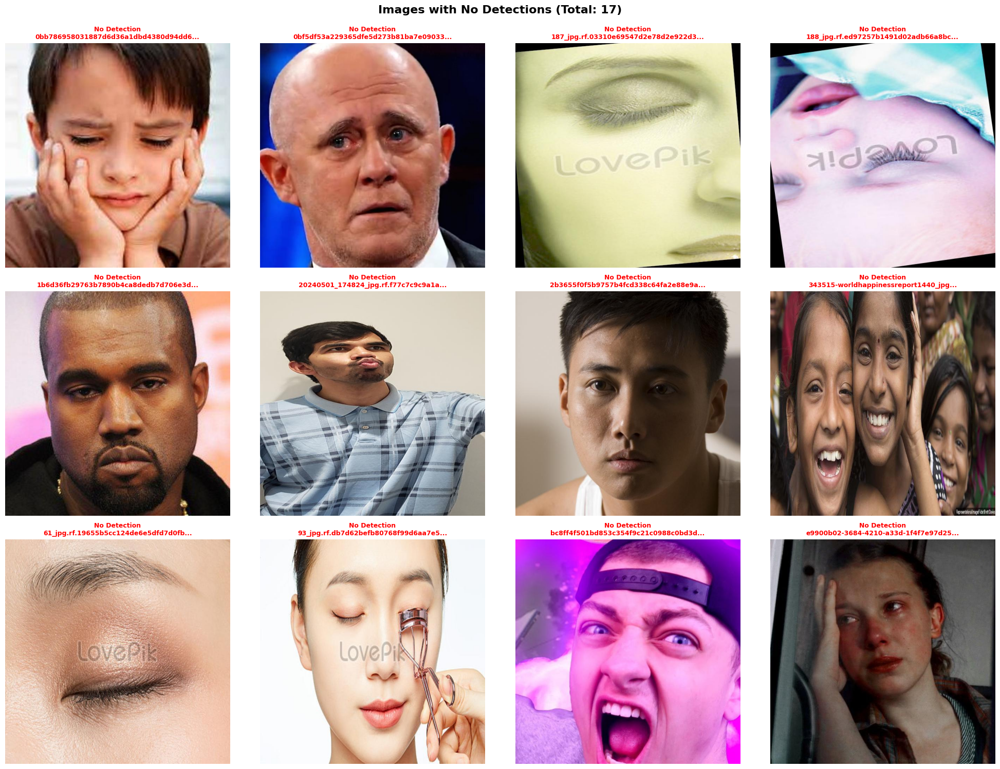

  Showing 12 out of 17 images with no detections

Checking ground truth for no-detection images...


In [16]:
# Visualize images with no detections
no_detection_images = predictions_df[predictions_df['class'] == 'No detection']['image'].unique()

print(f"\n{'='*60}")
print(f"Images with NO DETECTIONS: {len(no_detection_images)}")
print(f"{'='*60}")

if len(no_detection_images) > 0:
    # Show up to 12 samples
    num_samples = min(12, len(no_detection_images))
    sample_no_detections = no_detection_images[:num_samples]
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.ravel()
    
    for idx, img_name in enumerate(sample_no_detections):
        img_path = os.path.join(TEST_IMAGES_DIR, img_name)
        
        # Load and display original image
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        axes[idx].imshow(img_rgb)
        axes[idx].axis('off')
        axes[idx].set_title(f"No Detection\n{img_name[:35]}...", 
                           fontsize=9, color='red', fontweight='bold')
    
    # Hide unused subplots
    for idx in range(num_samples, 12):
        axes[idx].axis('off')
    
    plt.suptitle(f'Images with No Detections (Total: {len(no_detection_images)})', 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, 'test_set_no_detections.png'), dpi=200, bbox_inches='tight')
    plt.show()
    
    print(f"  Showing {num_samples} out of {len(no_detection_images)} images with no detections")
    
    # Check if these images have ground truth labels
    print(f"\nChecking ground truth for no-detection images...")
    no_det_with_gt = 0
    no_det_no_gt = 0
    
    for img_name in no_detection_images:
        label_name = os.path.splitext(img_name)[0] + '.txt'
        label_path = os.path.join(TEST_LABELS_DIR, label_name)
        
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                content = f.read().strip()
                if content:  # Has ground truth annotations
                    no_det_with_gt += 1
                else:  # Empty label file
                    no_det_no_gt += 1
        else:
            no_det_no_gt += 1
else:
    print("\n All test images have at least one detection!")

In [17]:
# Display prediction statistics
print("\n=== Detection Statistics ===")
class_counts = predictions_df[predictions_df['class'] != 'No detection']['class'].value_counts()
print(class_counts)

# Save detailed predictions
predictions_df.to_csv(os.path.join(OUTPUT_DIR, 'test_set_detailed_predictions.csv'), index=False)


=== Detection Statistics ===
class
relax       51
happy       30
romantic    28
rock        28
sad         26
surprise    22
angry       15
Name: count, dtype: int64


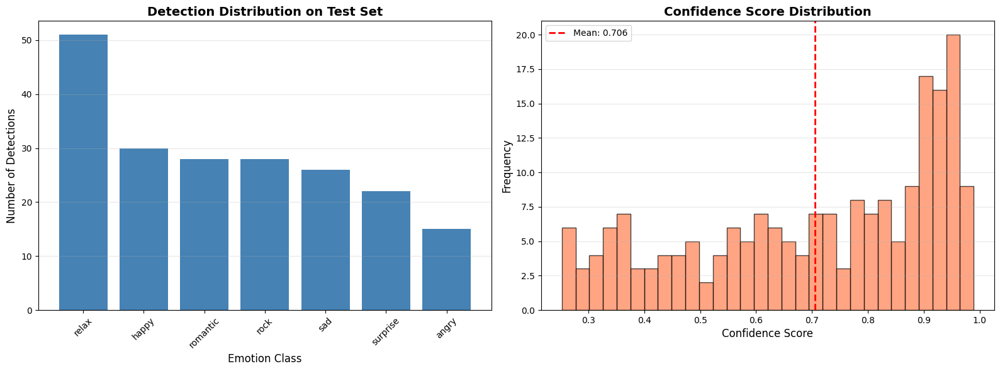

In [18]:
# Visualize detection distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Detection counts by class
class_counts_plot = predictions_df[predictions_df['class'] != 'No detection']['class'].value_counts()
axes[0].bar(class_counts_plot.index, class_counts_plot.values, color='steelblue')
axes[0].set_xlabel('Emotion Class', fontsize=12)
axes[0].set_ylabel('Number of Detections', fontsize=12)
axes[0].set_title('Detection Distribution on Test Set', fontsize=14, fontweight='bold')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(axis='y', alpha=0.3)

# Confidence distribution
valid_preds = predictions_df[predictions_df['class'] != 'No detection']
axes[1].hist(valid_preds['confidence'], bins=30, color='coral', edgecolor='black', alpha=0.7)
axes[1].set_xlabel('Confidence Score', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].set_title('Confidence Score Distribution', fontsize=14, fontweight='bold')
axes[1].axvline(valid_preds['confidence'].mean(), color='red', linestyle='--', 
                linewidth=2, label=f"Mean: {valid_preds['confidence'].mean():.3f}")
axes[1].legend()
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'test_set_detection_statistics.png'), dpi=300, bbox_inches='tight')
plt.show()

## 6. Export Predictions with Annotations

In [19]:
# Create output directory for annotated images
annotated_dir = os.path.join(OUTPUT_DIR, "annotated_predictions")
os.makedirs(annotated_dir, exist_ok=True)

# Save all predictions with annotations
for img_name in test_images[:50]:  # Save first 50 to avoid too many files
    img_path = os.path.join(TEST_IMAGES_DIR, img_name)
    results = model.predict(img_path, conf=0.25, iou=0.45, verbose=False)
    
    # Save annotated image
    annotated_img = results[0].plot()
    output_path = os.path.join(annotated_dir, f"pred_{img_name}")
    cv2.imwrite(output_path, annotated_img)

## 7. Summary Report

In [20]:
print("\n" + "="*60)
print("EMOTION DETECTION MODEL - TEST SET EVALUATION SUMMARY")
print("="*60)
print(f"Test Images: {len(test_images)}")
print(f"Classes: {', '.join(class_names)}")
print("\n--- Overall Performance ---")
print(f"Precision:    {metrics.box.mp:.4f}")
print(f"Recall:       {metrics.box.mr:.4f}")
print(f"mAP50:        {metrics.box.map50:.4f}")
print(f"mAP50-95:     {metrics.box.map:.4f}")
print("\n--- Best Performing Classes (by mAP50) ---")
top_classes = per_class_metrics.nlargest(3, 'mAP50')
for _, row in top_classes.iterrows():
    print(f"{row['Class']}: {row['mAP50']:.4f}")
print("\n--- Worst Performing Classes (by mAP50) ---")
bottom_classes = per_class_metrics.nsmallest(3, 'mAP50')
for _, row in bottom_classes.iterrows():
    print(f"{row['Class']}: {row['mAP50']:.4f}")
print("\n--- Detection Statistics ---")
print(f"Average Confidence: {valid_preds['confidence'].mean():.4f}")
print(f"Min Confidence:     {valid_preds['confidence'].min():.4f}")
print(f"Max Confidence:     {valid_preds['confidence'].max():.4f}")
print("\n" + "="*60)


EMOTION DETECTION MODEL - TEST SET EVALUATION SUMMARY
Test Images: 183
Classes: angry, happy, relax, rock, romantic, sad, surprise

--- Overall Performance ---
Precision:    0.8988
Recall:       0.8725
mAP50:        0.9410
mAP50-95:     0.6976

--- Best Performing Classes (by mAP50) ---
rock: 0.9950
surprise: 0.9932
romantic: 0.9660

--- Worst Performing Classes (by mAP50) ---
relax: 0.8392
sad: 0.8883
angry: 0.9473

--- Detection Statistics ---
Average Confidence: 0.7059
Min Confidence:     0.2524
Max Confidence:     0.9894



# Visualize misclassified prediction

In [21]:
# Analyze relax vs background misclassifications using IoU matching
def parse_yolo_label_with_boxes(label_path):
    """Parse YOLO format label file with bounding box coordinates"""
    objects = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    x_center = float(parts[1])
                    y_center = float(parts[2])
                    width = float(parts[3])
                    height = float(parts[4])
                    objects.append({
                        'class_id': class_id,
                        'class_name': class_names[class_id],
                        'x_center': x_center,
                        'y_center': y_center,
                        'width': width,
                        'height': height
                    })
    return objects

def calculate_iou_simple(box1, box2):
    """Calculate IoU between two boxes in YOLO format (x_center, y_center, width, height)"""
    # Convert to corner coordinates
    x1_min = box1[0] - box1[2] / 2
    y1_min = box1[1] - box1[3] / 2
    x1_max = box1[0] + box1[2] / 2
    y1_max = box1[1] + box1[3] / 2
    
    x2_min = box2[0] - box2[2] / 2
    y2_min = box2[1] - box2[3] / 2
    x2_max = box2[0] + box2[2] / 2
    y2_max = box2[1] + box2[3] / 2
    
    # Calculate intersection
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)
    
    if inter_x_max < inter_x_min or inter_y_max < inter_y_min:
        return 0.0
    
    inter_area = (inter_x_max - inter_x_min) * (inter_y_max - inter_y_min)
    box1_area = box1[2] * box1[3]
    box2_area = box2[2] * box2[3]
    union_area = box1_area + box2_area - inter_area
    
    return inter_area / union_area if union_area > 0 else 0.0

# Find specific misclassifications using IoU matching
relax_as_background = []  # GT: relax, Pred: background (unmatched GT relax)
background_as_relax = []  # GT: background, Pred: relax (unmatched pred relax)
relax_misclassified = []  # GT: relax, Pred: other class (matched but wrong class)

iou_threshold = 0.5

for img_name in test_images:
    img_path = os.path.join(TEST_IMAGES_DIR, img_name)
    label_name = os.path.splitext(img_name)[0] + '.txt'
    label_path = os.path.join(TEST_LABELS_DIR, label_name)
    
    # Get ground truth objects with boxes
    gt_objects = parse_yolo_label_with_boxes(label_path)
    
    # Get predictions
    results = model.predict(img_path, conf=0.25, iou=0.45, verbose=False)
    boxes = results[0].boxes
    
    # Convert predictions to our format
    predictions = []
    if len(boxes) > 0:
        img = cv2.imread(img_path)
        img_h, img_w = img.shape[:2]
        
        for i in range(len(boxes)):
            box_xyxy = boxes.xyxy[i].cpu().numpy()
            cls = int(boxes.cls[i].cpu().numpy())
            conf = float(boxes.conf[i].cpu().numpy())
            
            # Convert to YOLO format (normalized)
            x_center = ((box_xyxy[0] + box_xyxy[2]) / 2) / img_w
            y_center = ((box_xyxy[1] + box_xyxy[3]) / 2) / img_h
            width = (box_xyxy[2] - box_xyxy[0]) / img_w
            height = (box_xyxy[3] - box_xyxy[1]) / img_h
            
            predictions.append({
                'class_id': cls,
                'class_name': class_names[cls],
                'confidence': conf,
                'x_center': x_center,
                'y_center': y_center,
                'width': width,
                'height': height
            })
    
    # Match ground truth to predictions using IoU
    matched_gt_indices = set()
    matched_pred_indices = set()
    
    # First pass: match objects
    for i, gt in enumerate(gt_objects):
        best_iou = 0
        best_pred_idx = -1
        
        for j, pred in enumerate(predictions):
            if j in matched_pred_indices:
                continue
            
            gt_box = [gt['x_center'], gt['y_center'], gt['width'], gt['height']]
            pred_box = [pred['x_center'], pred['y_center'], pred['width'], pred['height']]
            iou = calculate_iou_simple(gt_box, pred_box)
            
            if iou > best_iou:
                best_iou = iou
                best_pred_idx = j
        
        if best_iou >= iou_threshold and best_pred_idx != -1:
            matched_gt_indices.add(i)
            matched_pred_indices.add(best_pred_idx)
            pred = predictions[best_pred_idx]
            
            # Check if it's a relax that got misclassified to something else
            if gt['class_name'] == 'relax' and pred['class_name'] != 'relax':
                relax_misclassified.append({
                    'image': img_name,
                    'ground_truth': 'relax',
                    'predicted': pred['class_name'],
                    'confidence': pred['confidence'],
                    'iou': best_iou,
                    'case': 'misclassified to other class'
                })
    
    # Find unmatched ground truth relax objects (predicted as background)
    for i, gt in enumerate(gt_objects):
        if i not in matched_gt_indices and gt['class_name'] == 'relax':
            relax_as_background.append({
                'image': img_name,
                'ground_truth': 'relax',
                'predicted': 'background (no match)',
                'case': 'unmatched/missed'
            })
    
    # Find unmatched relax predictions (false positives)
    for j, pred in enumerate(predictions):
        if j not in matched_pred_indices and pred['class_name'] == 'relax':
            background_as_relax.append({
                'image': img_name,
                'ground_truth': 'background (no match)',
                'predicted': 'relax',
                'confidence': pred['confidence'],
                'case': 'false positive'
            })

print(f"\n{'='*60}")
print(f"RELAX DETECTION ERRORS (IoU-based matching):")
print(f"{'='*60}")
print(f"Relax > Background (unmatched GT):        {len(relax_as_background)}")
print(f"Relax > Other class (matched but wrong):  {len(relax_misclassified)}")
print(f"Background > Relax (false positive):      {len(background_as_relax)}")
print(f"{'='*60}")
print(f"\nTotal 'true relax' not detected correctly: {len(relax_as_background) + len(relax_misclassified)}")
print(f"Total 'predicted relax' incorrectly:       {len(background_as_relax)}")
print(f"{'='*60}")


RELAX DETECTION ERRORS (IoU-based matching):
Relax > Background (unmatched GT):        11
Relax > Other class (matched but wrong):  0
Background > Relax (false positive):      15

Total 'true relax' not detected correctly: 11
Total 'predicted relax' incorrectly:       15


Truth = BACKGROUND, Predicted = RELAX (False Positive)


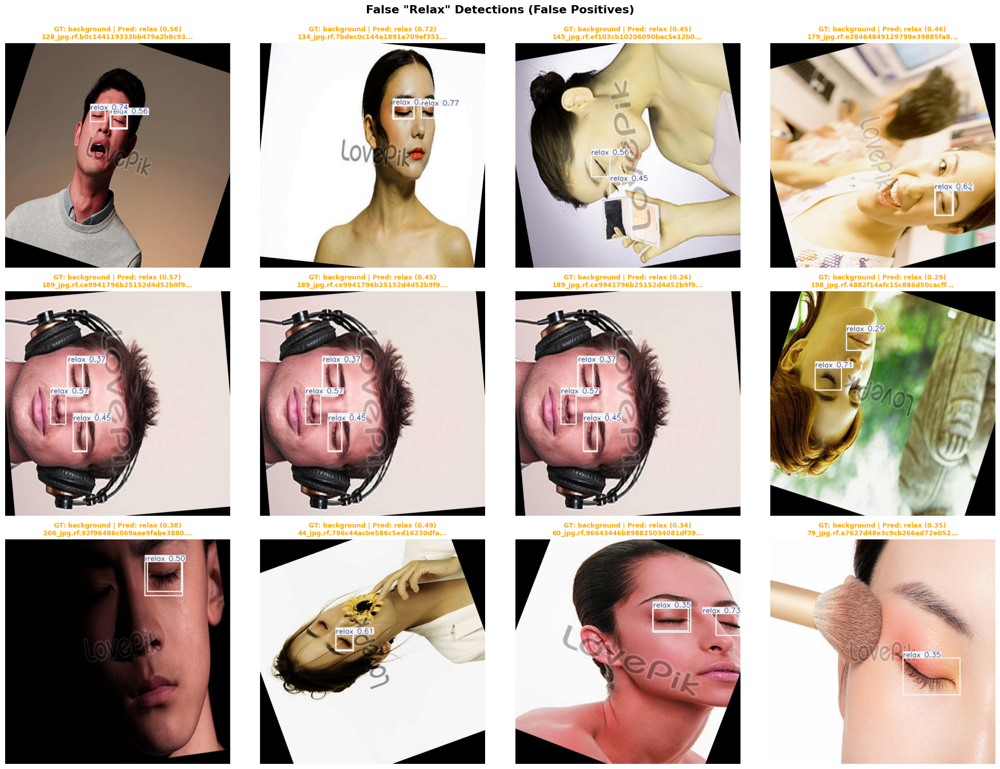

  Showing 12 out of 15 total cases

False Positive Confidence Statistics:
  Mean: 0.4435
  Min:  0.2595
  Max:  0.7213


In [22]:
# Visualize: background predicted as relax (false positives)
if len(background_as_relax) > 0:
    print("Truth = BACKGROUND, Predicted = RELAX (False Positive)")
    
    num_samples = min(12, len(background_as_relax))
    samples = background_as_relax[:num_samples]
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.ravel()
    
    for idx, item in enumerate(samples):
        img_path = os.path.join(TEST_IMAGES_DIR, item['image'])
        
        # Run prediction and show what was detected
        results = model.predict(img_path, conf=0.25, iou=0.45, verbose=False)
        annotated_img = results[0].plot()
        annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
        
        axes[idx].imshow(annotated_img)
        axes[idx].axis('off')
        
        conf = item.get('confidence', 0)
        title = f"GT: background | Pred: relax ({conf:.2f})\n{item['image'][:35]}..."
        axes[idx].set_title(title, fontsize=9, color='orange', fontweight='bold')
    
    # Hide unused subplots
    for idx in range(num_samples, 12):
        axes[idx].axis('off')
    
    plt.suptitle('False "Relax" Detections (False Positives)', 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, 'misclassification_background_as_relax.png'), dpi=200, bbox_inches='tight')
    plt.show()
    
    print(f"  Showing {num_samples} out of {len(background_as_relax)} total cases")
    
    # Show confidence statistics for false positives
    if len(background_as_relax) > 0:
        confidences = [item['confidence'] for item in background_as_relax]
        print(f"\nFalse Positive Confidence Statistics:")
        print(f"  Mean: {np.mean(confidences):.4f}")
        print(f"  Min:  {np.min(confidences):.4f}")
        print(f"  Max:  {np.max(confidences):.4f}")
else:
    print("\nNo cases of background being predicted as relax")


TRUTH = RELAX, but PREDICTED INCORRECTLY


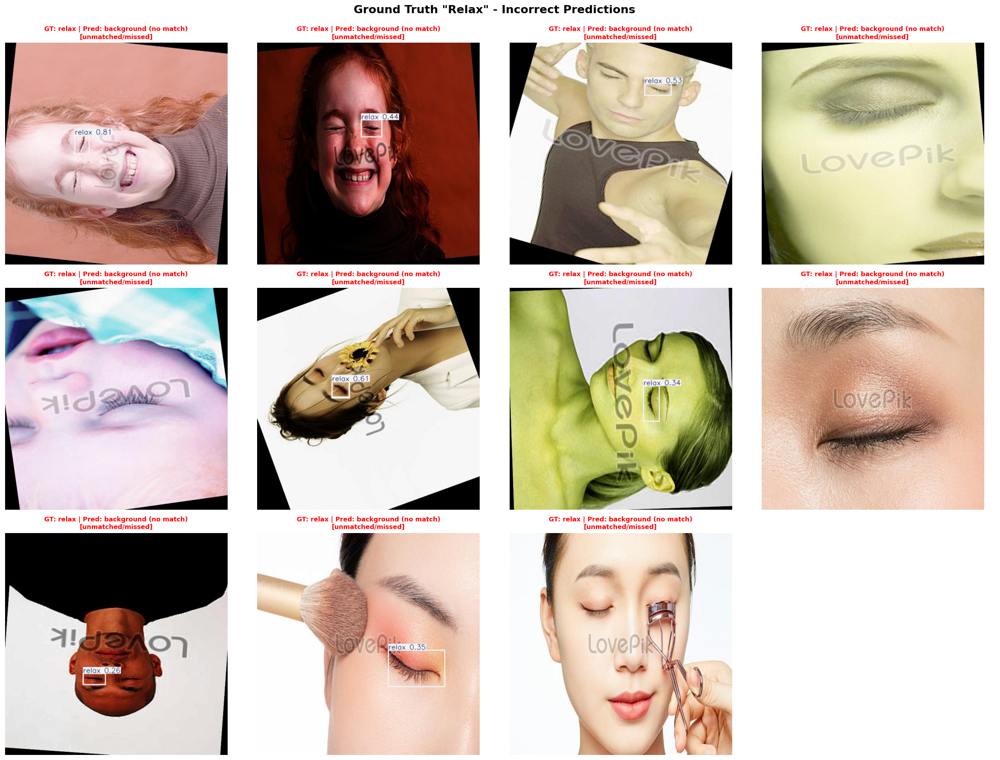

  Showing 11 out of 11 total cases

Breakdown:
  - Missed (no detection): 11
  - Misclassified (wrong class): 0


In [23]:
# Visualize all relax errors combined
all_relax_errors = []

# Add unmatched relax (predicted as background)
for item in relax_as_background:
    all_relax_errors.append({**item, 'color': 'red', 'type': 'Missed (Background)'})

# Add misclassified relax (predicted as other class)
for item in relax_misclassified:
    all_relax_errors.append({**item, 'color': 'orange', 'type': 'Misclassified'})

if len(all_relax_errors) > 0:
    print("\n" + "="*60)
    print("TRUTH = RELAX, but PREDICTED INCORRECTLY")
    print("="*60)
    
    num_samples = min(12, len(all_relax_errors))
    samples = all_relax_errors[:num_samples]
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.ravel()
    
    for idx, item in enumerate(samples):
        img_path = os.path.join(TEST_IMAGES_DIR, item['image'])
        
        # Run prediction and show
        results = model.predict(img_path, conf=0.25, iou=0.45, verbose=False)
        annotated_img = results[0].plot()
        annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
        
        axes[idx].imshow(annotated_img)
        axes[idx].axis('off')
        
        pred = item['predicted']
        error_type = item['case']
        conf = item.get('confidence', 0)
        
        if conf > 0:
            title = f"GT: relax | Pred: {pred} ({conf:.2f})\n[{error_type}]"
        else:
            title = f"GT: relax | Pred: {pred}\n[{error_type}]"
        
        axes[idx].set_title(title, fontsize=9, color=item['color'], fontweight='bold')
    
    # Hide unused subplots
    for idx in range(num_samples, 12):
        axes[idx].axis('off')
    
    plt.suptitle('Ground Truth "Relax" - Incorrect Predictions', 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, 'misclassification_relax_errors.png'), dpi=200, bbox_inches='tight')
    plt.show()
    
    print(f"  Showing {num_samples} out of {len(all_relax_errors)} total cases")
    
    # Show breakdown
    print(f"\nBreakdown:")
    print(f"  - Missed (no detection): {len(relax_as_background)}")
    print(f"  - Misclassified (wrong class): {len(relax_misclassified)}")
else:
    print("\nNo errors in detecting relax!")